In [47]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='2'

In [48]:
import numpy as np
import cv2 as cv
import tensorflow as tf
from tensorflow_examples.models.pix2pix import pix2pix

In [50]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

MEDIA_PATH = os.path.join('/media', 'disk2', 'amaltsev', 'car_lp_generator')

In [51]:
real_plates_path = os.path.join(MEDIA_PATH, 'real')
rendered_plates_path = os.path.join(MEDIA_PATH, 'rendered')

real_train_path = os.path.join(real_plates_path, 'train')
real_test_path = os.path.join(real_plates_path, 'test')

rendered_train_path = os.path.join(rendered_plates_path, 'train')
rendered_test_path = os.path.join(rendered_plates_path, 'test')

In [52]:
# def gen_train_real():
#     for img in os.listdir(real_train_path):
#         image = cv.imread(os.path.join(real_train_path, img))
#         yield image

        
# def gen_test_real():
#     for img in os.listdir(real_test_path):
#         image = cv.imread(os.path.join(real_test_path, img))
#         yield image

        
# def gen_train_rendered():
#     for img in os.listdir(rendered_train_path):
#         image = cv.imread(os.path.join(rendered_train_path, img))
#         yield image
        
        
# def gen_test_rendered():
#     for img in os.listdir(rendered_test_path):
#         image = cv.imread(os.path.join(rendered_test_path, img))
#         yield image


train_real = tf.data.Dataset.from_tensor_slices([os.path.join(real_train_path, img) for img in os.listdir(real_train_path)])
test_real = tf.data.Dataset.from_tensor_slices([os.path.join(real_test_path, img) for img in os.listdir(real_test_path)])
train_rendered = tf.data.Dataset.from_tensor_slices([os.path.join(rendered_train_path, img) for img in os.listdir(rendered_train_path)])
test_rendered = tf.data.Dataset.from_tensor_slices([os.path.join(rendered_test_path, img) for img in os.listdir(rendered_test_path)])

# image = tf.io.read_file([os.path.join(real_train_path, img) for img in os.listdir(real_train_path)][0])
# print(image)
# print(type(image))
# print(image.shape)

In [53]:
def random_crop(image):
    cropped_image = tf.image.random_crop(image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image

In [54]:
# normalizing the images to [-1, 1]
def normalize(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

In [55]:
def random_jitter(image):
    # resizing to 286 x 286 x 3
    image = tf.image.resize(image, [286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    # randomly cropping to 256 x 256 x 3
    image = random_crop(image)

    # random mirroring
    image = tf.image.random_flip_left_right(image)

    return image

In [56]:
def load_preprocess_image_train(path):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = random_jitter(image)
    image = normalize(image)
    return image

In [57]:
def load_preprocess_image_test(path):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = normalize(image)
    return image

In [58]:
train_real = train_real.map(load_preprocess_image_train, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)
train_rendered = train_rendered.map(load_preprocess_image_train, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)
test_real = test_real.map(load_preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)
test_rendered = test_rendered.map(load_preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(1)

In [59]:
sample_real = next(iter(train_real))
sample_rendered = next(iter(train_rendered))

In [60]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


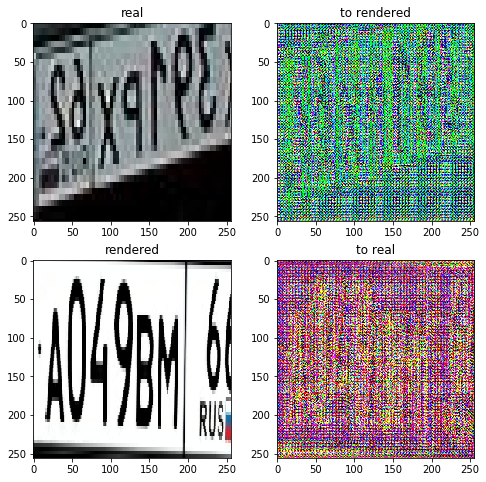

In [61]:
to_rendered = generator_g(sample_real)
to_real = generator_f(sample_rendered)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_real, to_rendered, sample_rendered, to_real]
title = ['real', 'to rendered', 'rendered', 'to real']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    if i % 2 == 0:
        plt.imshow(imgs[i][0] * 0.5 + 0.5)
    else:
        plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

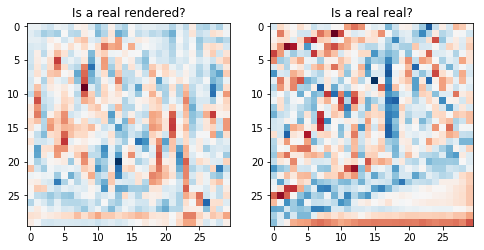

In [62]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real rendered?')
plt.imshow(discriminator_y(sample_rendered)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real real?')
plt.imshow(discriminator_x(sample_real)[0, ..., -1], cmap='RdBu_r')

plt.show()

In [63]:
LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)


def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)

    generated_loss = loss_obj(tf.zeros_like(generated), generated)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss * 0.5


def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)


def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss1

In [64]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

In [65]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [66]:
checkpoint_path = os.path.join(MEDIA_PATH, 'checkpoints', 'train')

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


In [67]:
EPOCHS = 40


def generate_images(model, test_input):
    prediction = model(test_input)

    plt.figure(figsize=(12, 12))

    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Predicted Image']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [68]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X.

        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = adversarial loss + cycle loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))

    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))

    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

................................................................................

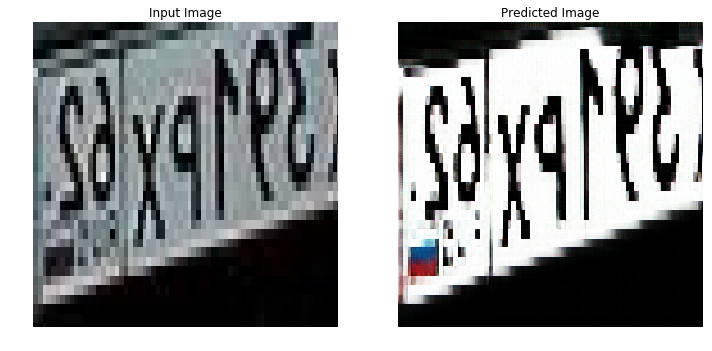

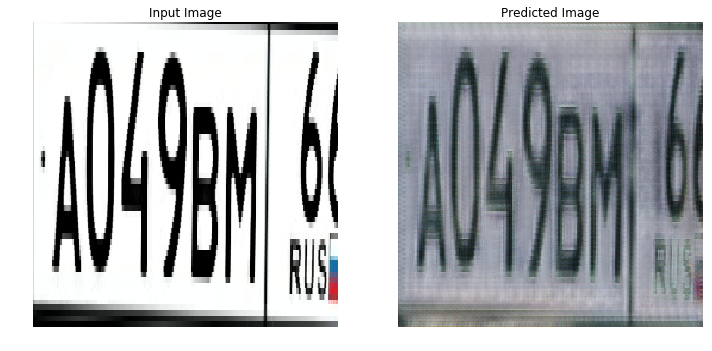

Time taken for epoch 1 is 918.8414542675018 sec

................................................................................

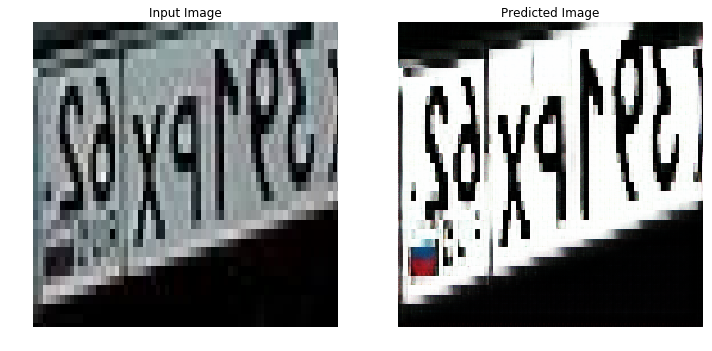

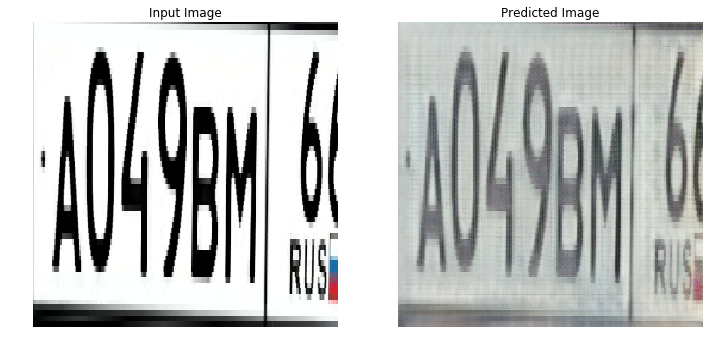

Time taken for epoch 2 is 903.8063900470734 sec

................................................................................

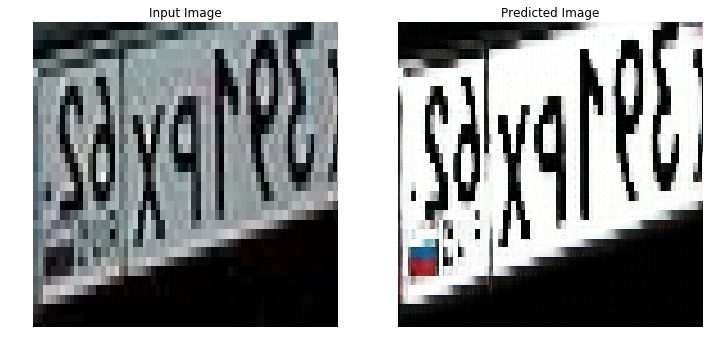

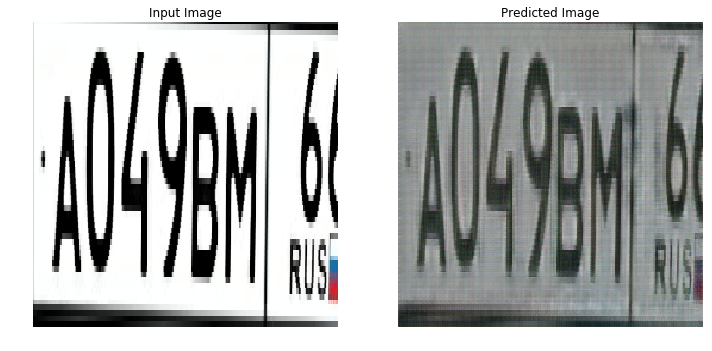

Time taken for epoch 3 is 906.7651398181915 sec

................................................................................

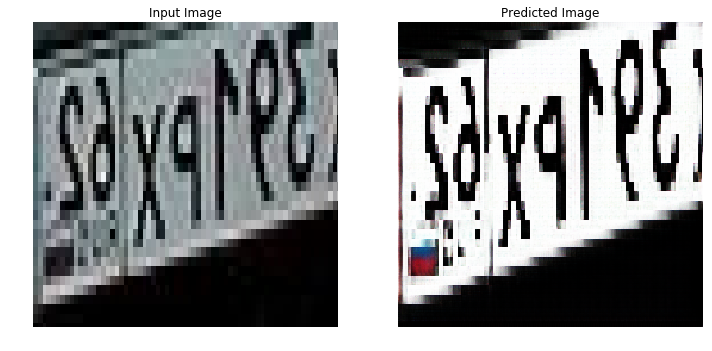

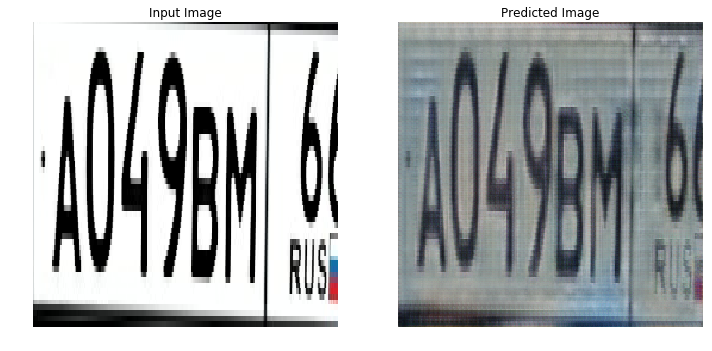

Time taken for epoch 4 is 908.1983323097229 sec

................................................................................

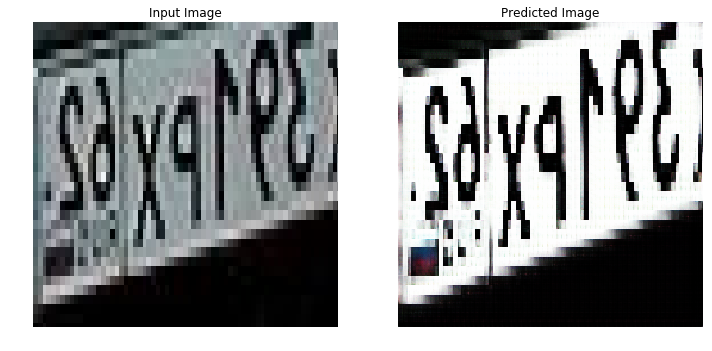

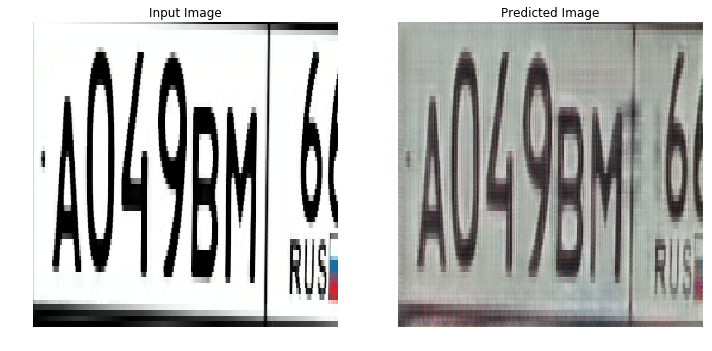

Saving checkpoint for epoch 5 at /media/disk2/amaltsev/car_lp_generator/checkpoints/train/ckpt-5
Time taken for epoch 5 is 916.2642407417297 sec

................................................................................

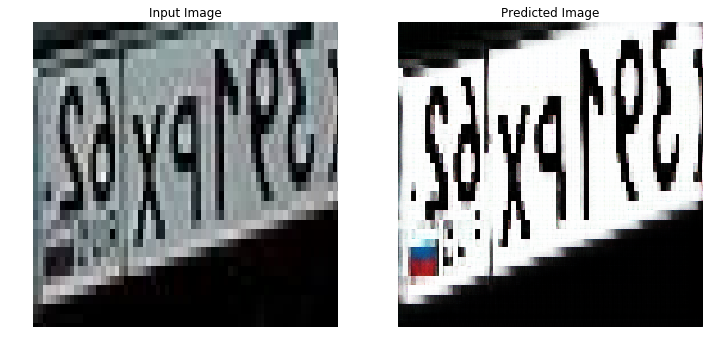

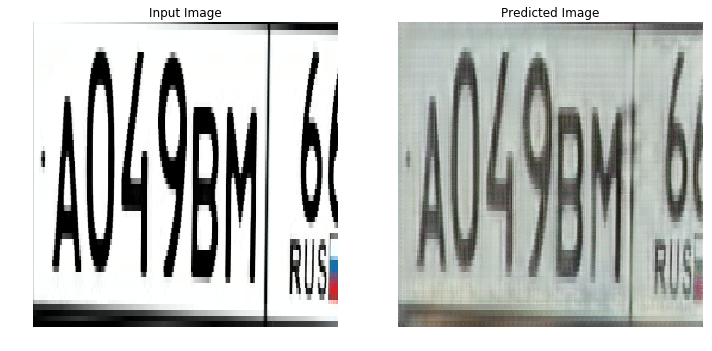

Time taken for epoch 6 is 910.014271736145 sec

................................................................................

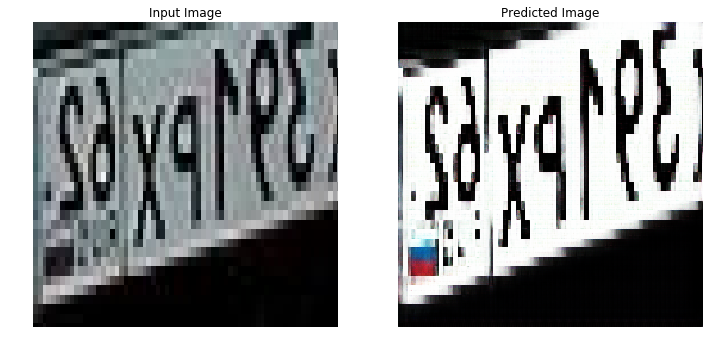

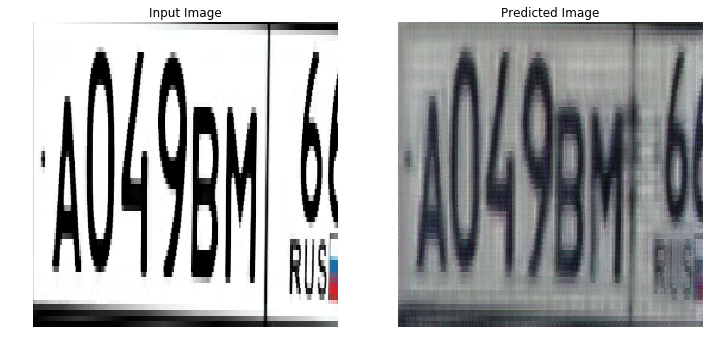

Time taken for epoch 7 is 909.4089167118073 sec

................................................................................

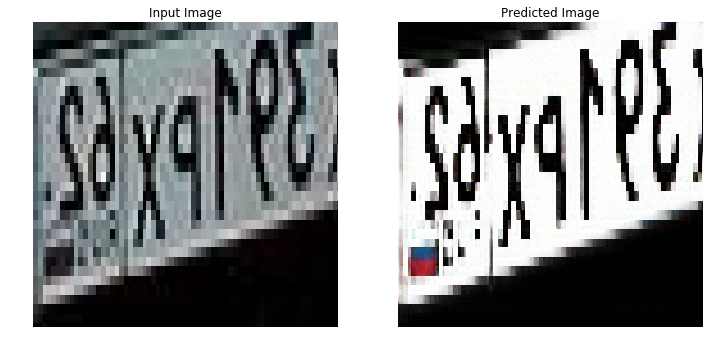

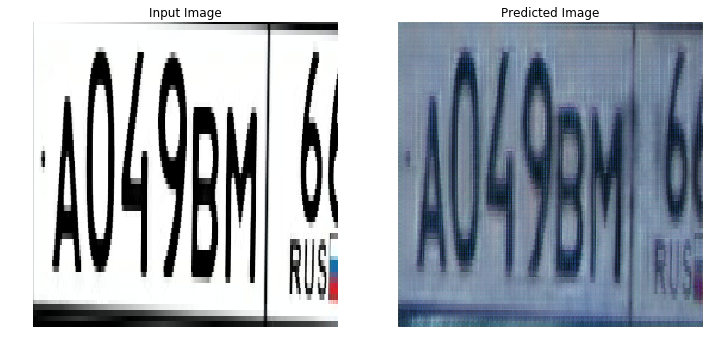

Time taken for epoch 8 is 910.5728311538696 sec

................................................................................

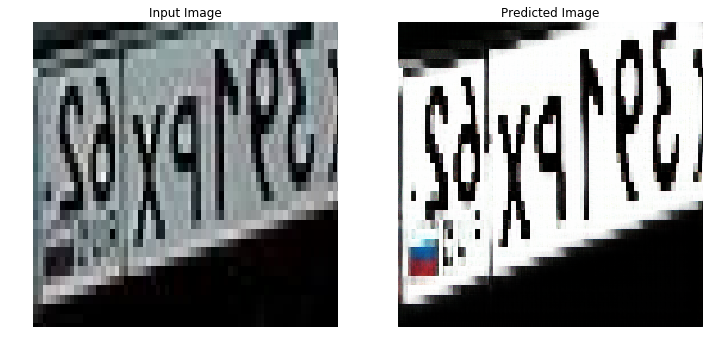

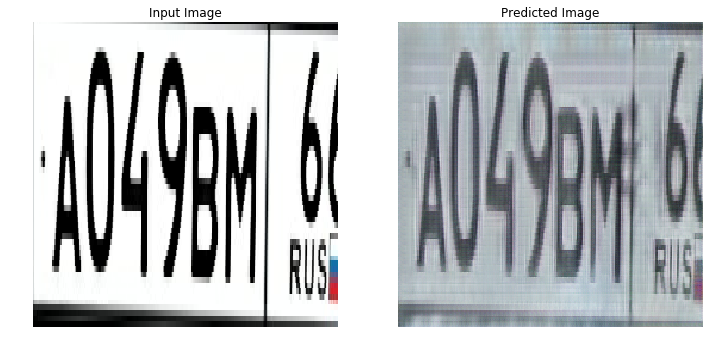

Time taken for epoch 9 is 905.3066132068634 sec

................................................................................

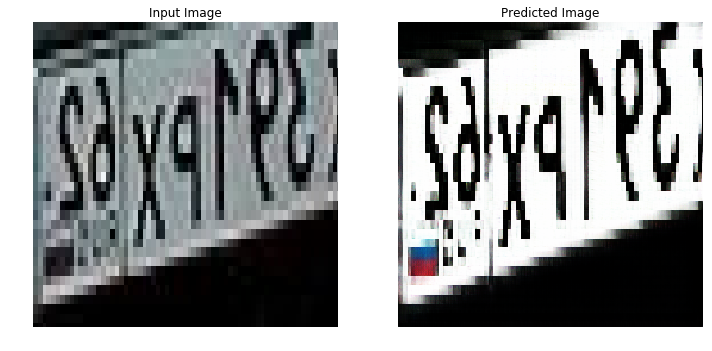

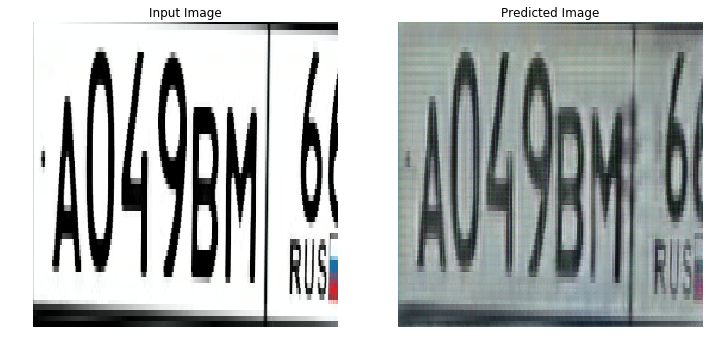

Saving checkpoint for epoch 10 at /media/disk2/amaltsev/car_lp_generator/checkpoints/train/ckpt-6
Time taken for epoch 10 is 906.0916380882263 sec

................................................................................

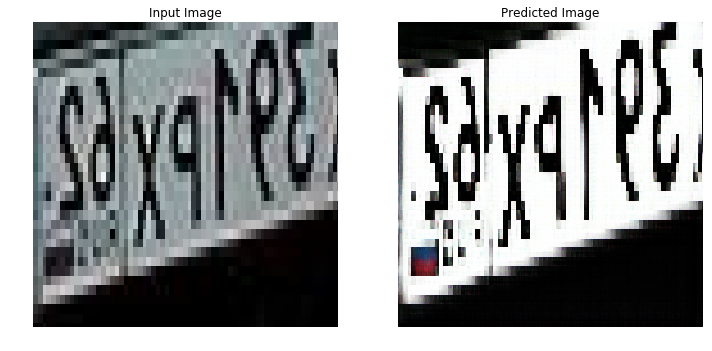

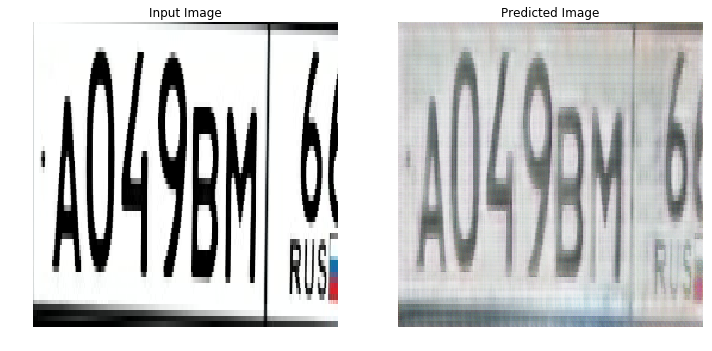

Time taken for epoch 11 is 906.5372717380524 sec

................................................................................

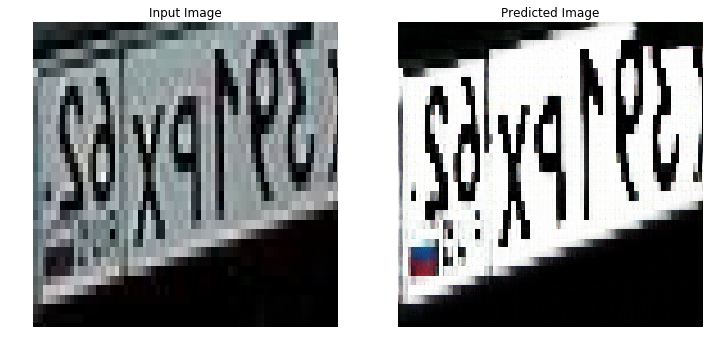

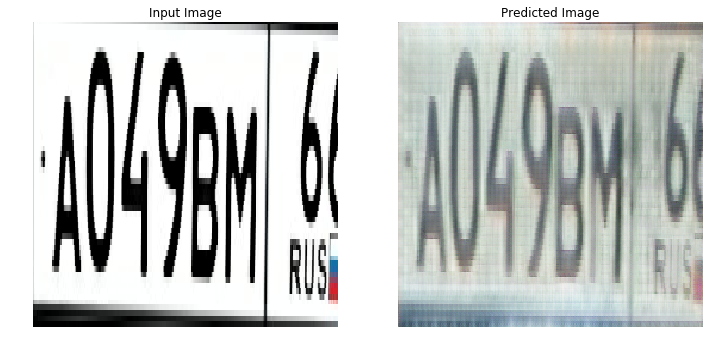

Time taken for epoch 12 is 902.6046838760376 sec

................................................................................

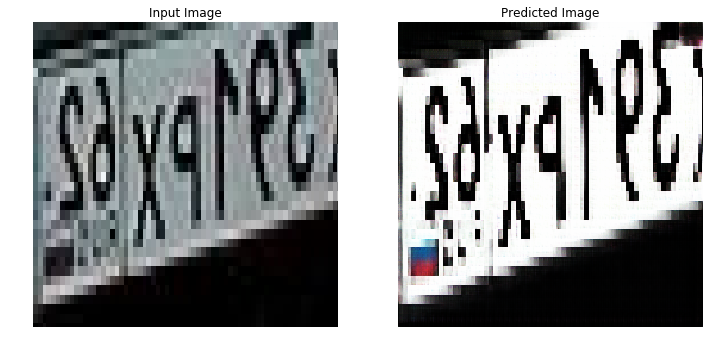

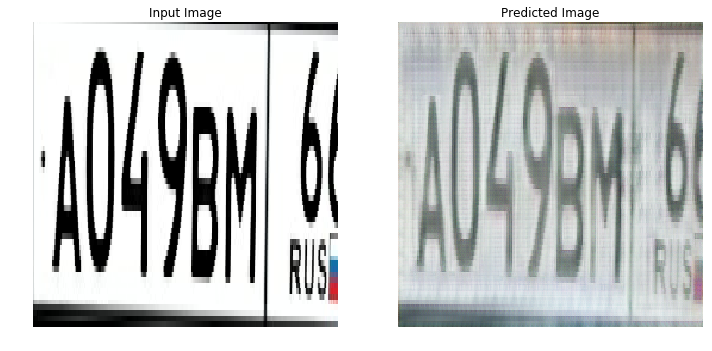

Time taken for epoch 13 is 910.2238652706146 sec

................................................................................

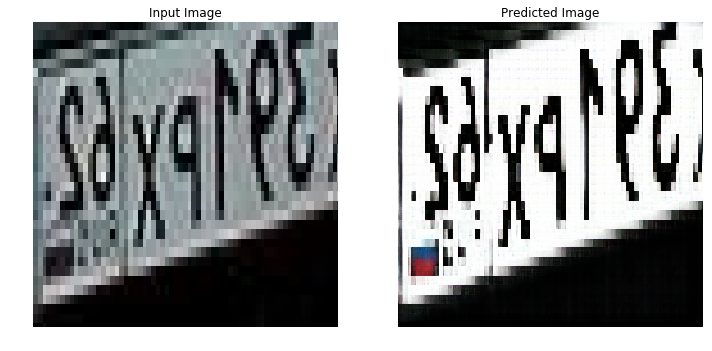

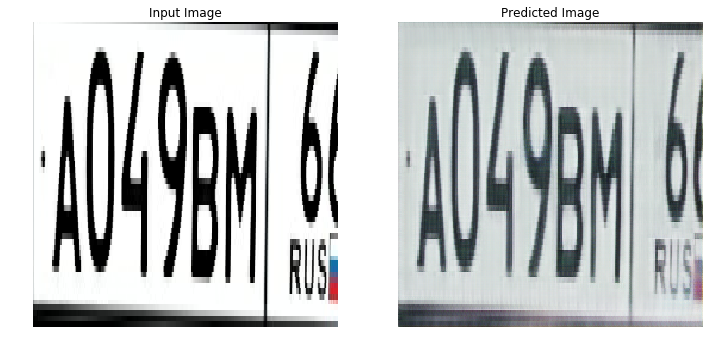

Time taken for epoch 14 is 910.5512316226959 sec

................................................................................

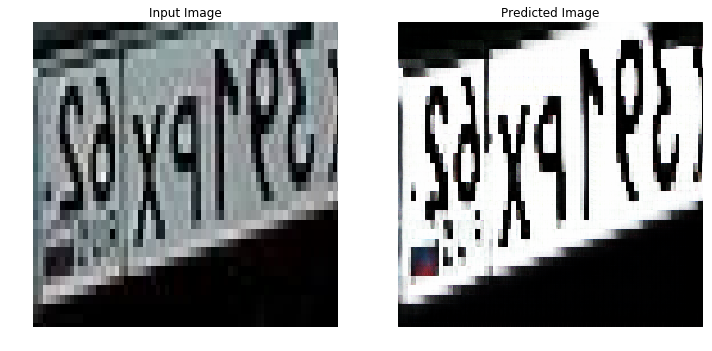

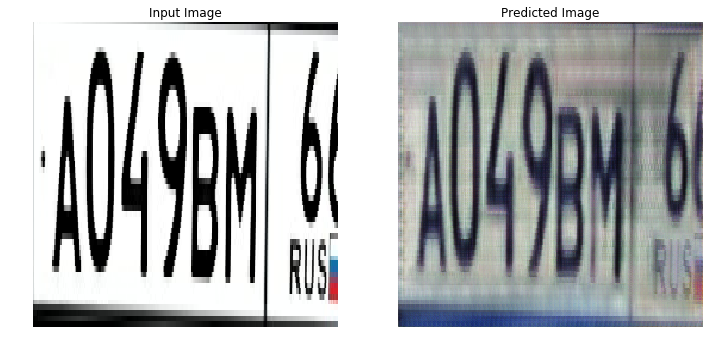

Saving checkpoint for epoch 15 at /media/disk2/amaltsev/car_lp_generator/checkpoints/train/ckpt-7
Time taken for epoch 15 is 943.5966007709503 sec

................................................................................

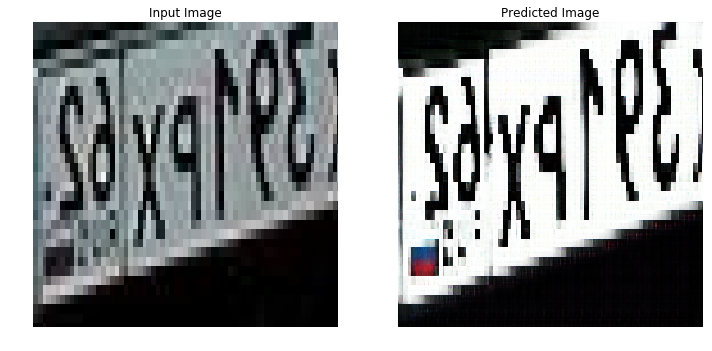

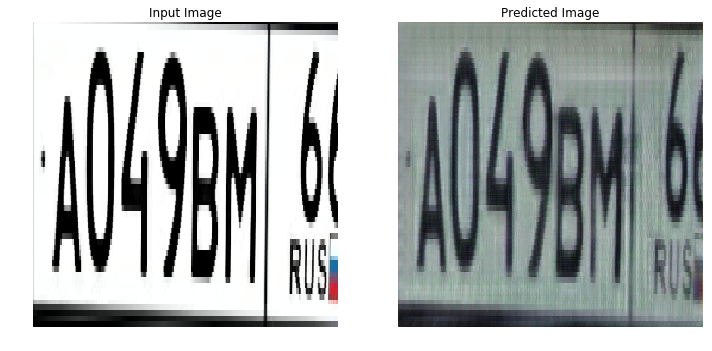

Time taken for epoch 16 is 982.8720943927765 sec

................................................................................

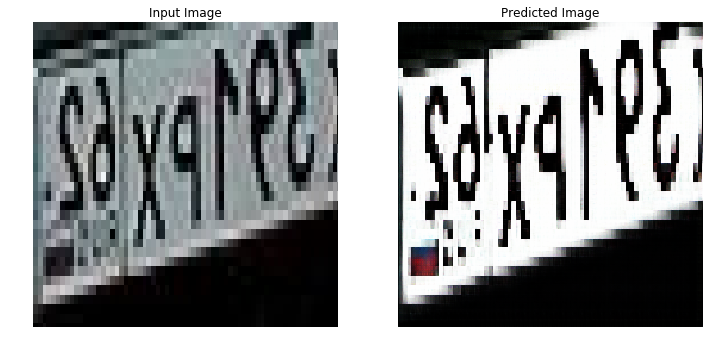

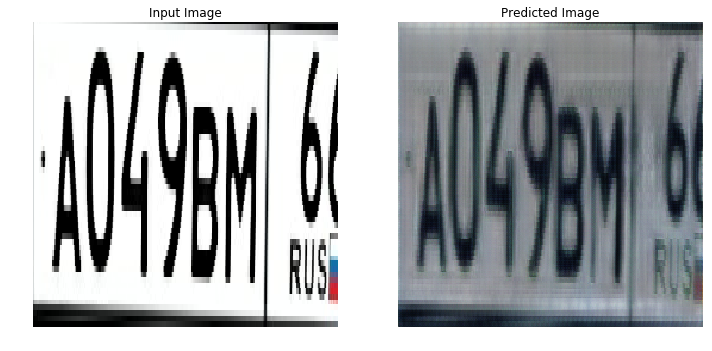

Time taken for epoch 17 is 945.4345405101776 sec

................................................................................

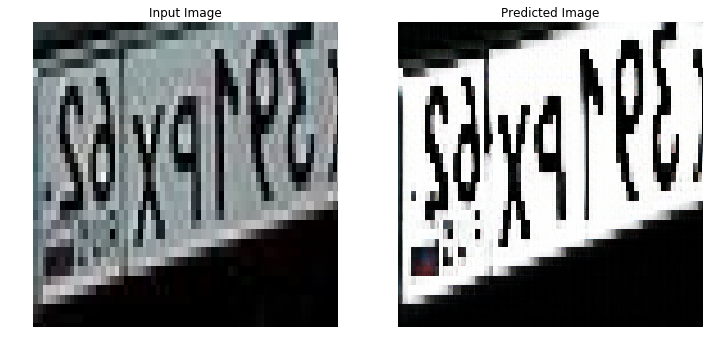

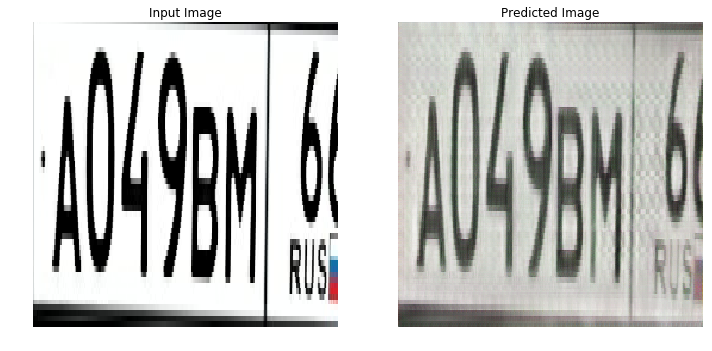

Time taken for epoch 18 is 912.257509469986 sec

................................................................................

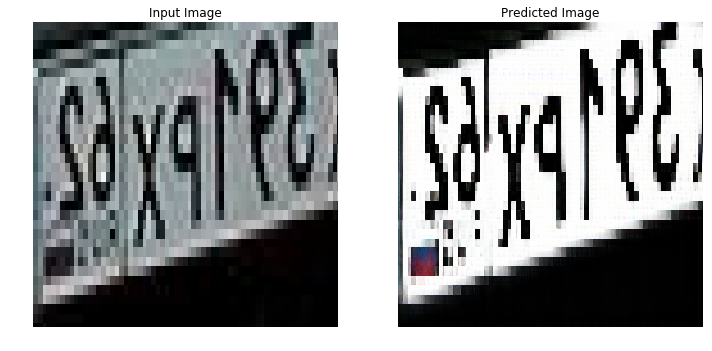

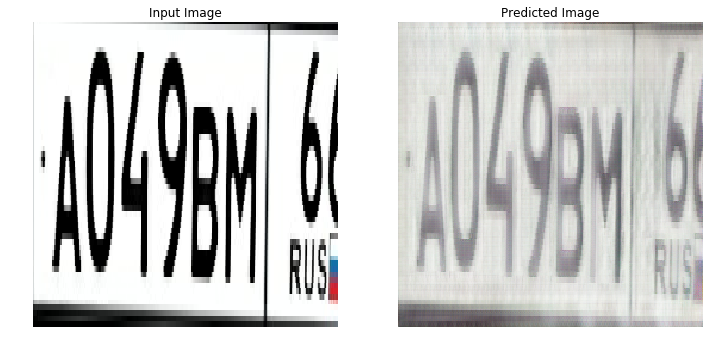

Time taken for epoch 19 is 914.9142298698425 sec

................................................................................

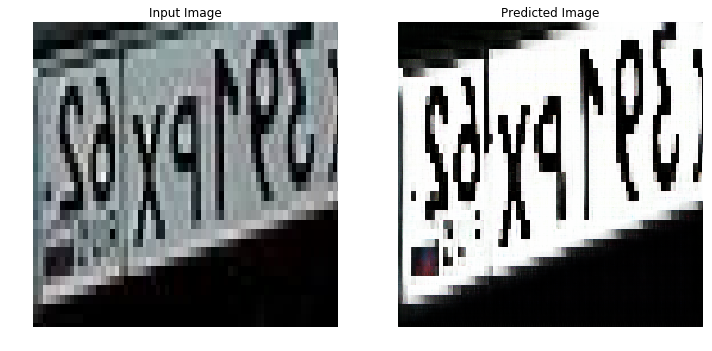

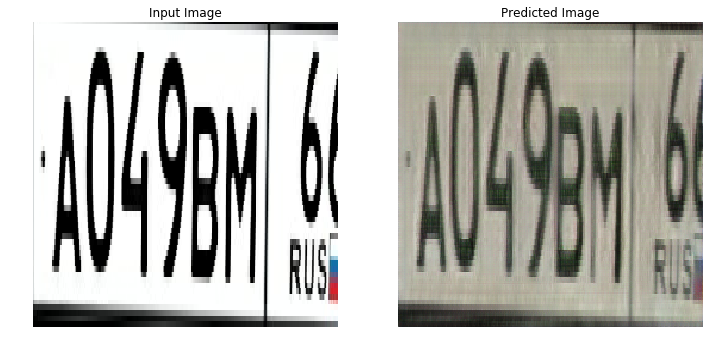

Saving checkpoint for epoch 20 at /media/disk2/amaltsev/car_lp_generator/checkpoints/train/ckpt-8
Time taken for epoch 20 is 921.0702855587006 sec

................................................................................

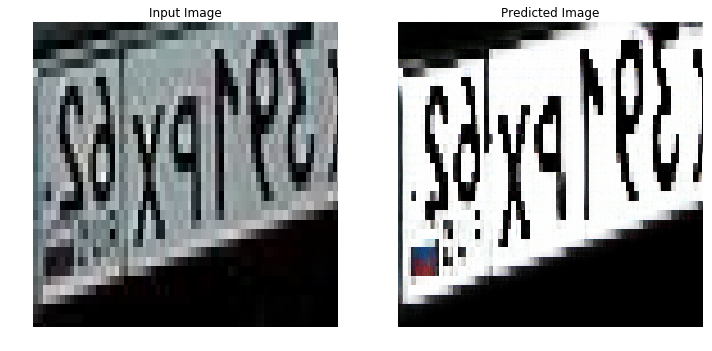

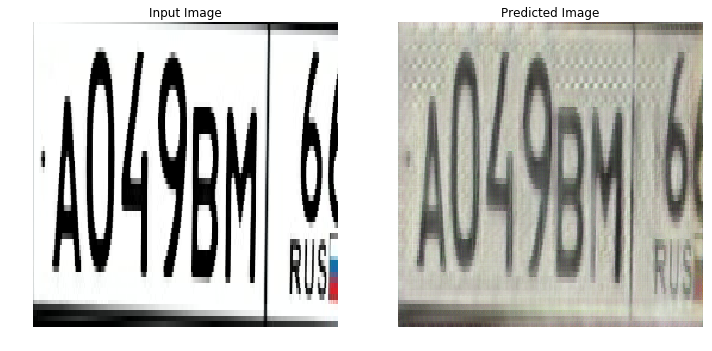

Time taken for epoch 21 is 976.1847205162048 sec

................................................................................

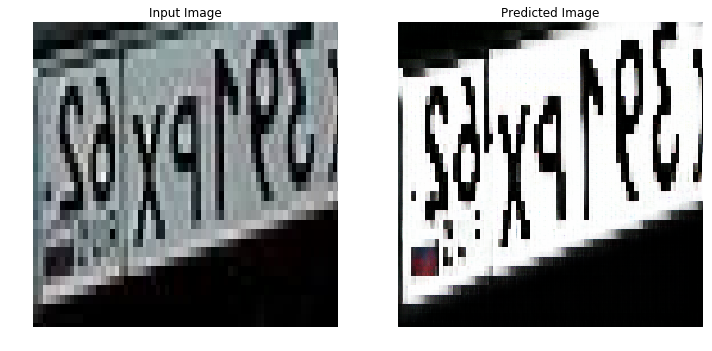

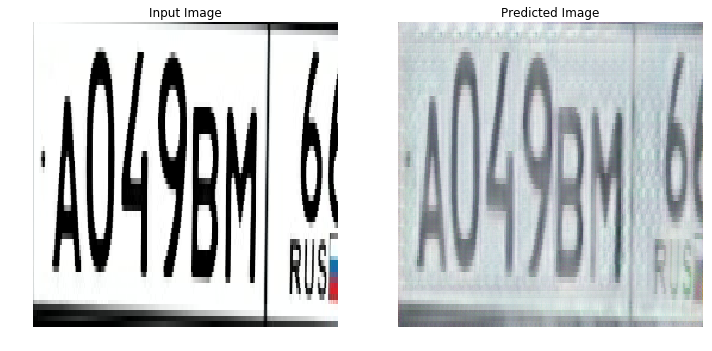

Time taken for epoch 22 is 1093.656054019928 sec

................................................................................

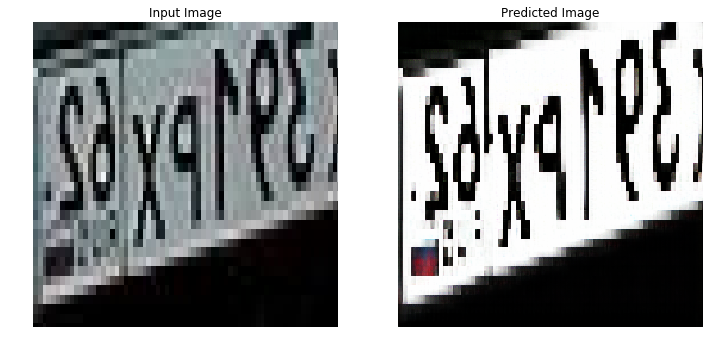

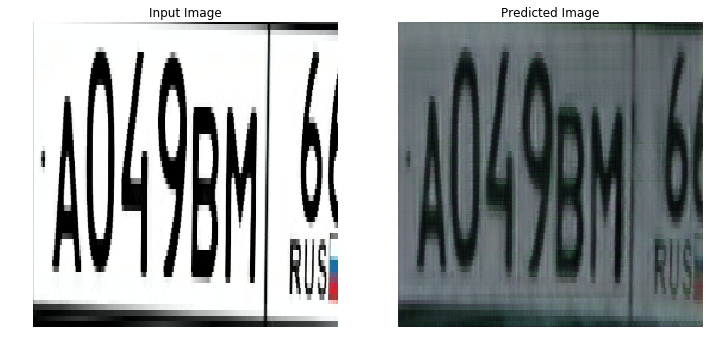

Time taken for epoch 23 is 1120.7545838356018 sec

................................................................................

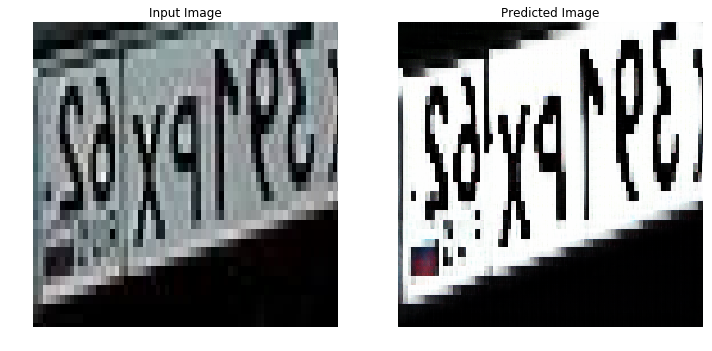

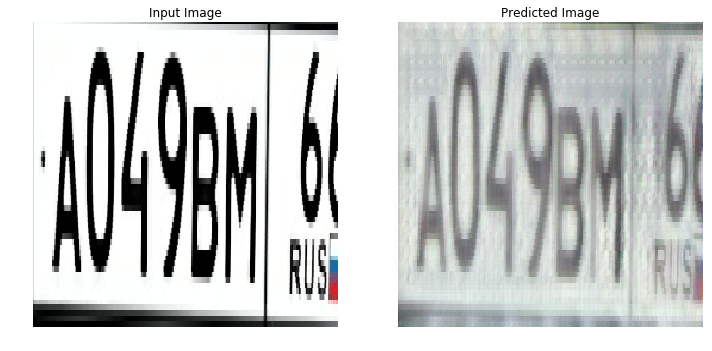

Time taken for epoch 24 is 1097.9052007198334 sec

................................................................................

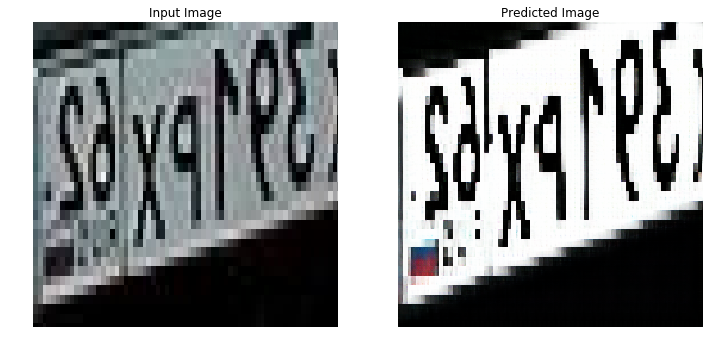

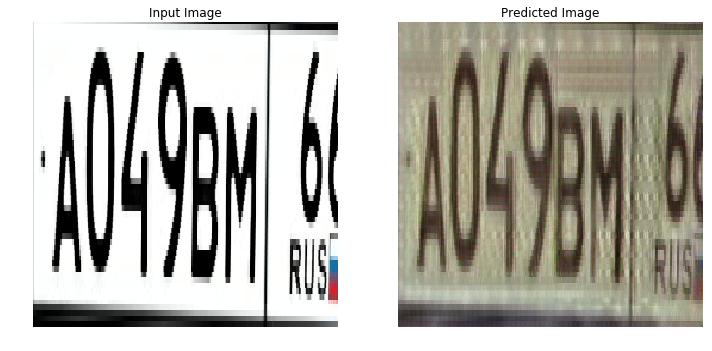

Saving checkpoint for epoch 25 at /media/disk2/amaltsev/car_lp_generator/checkpoints/train/ckpt-9
Time taken for epoch 25 is 1072.1535856723785 sec

................................................................................

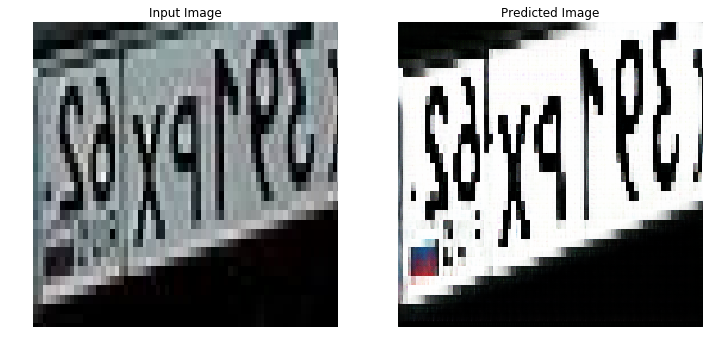

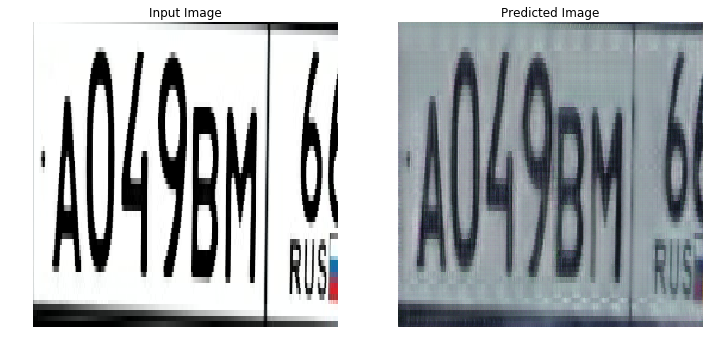

Time taken for epoch 26 is 1066.5060195922852 sec

................................................................................

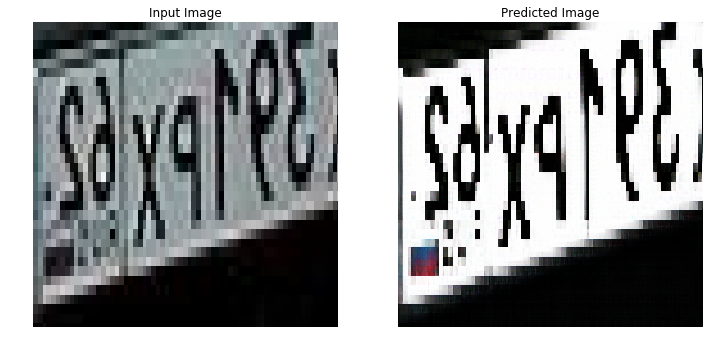

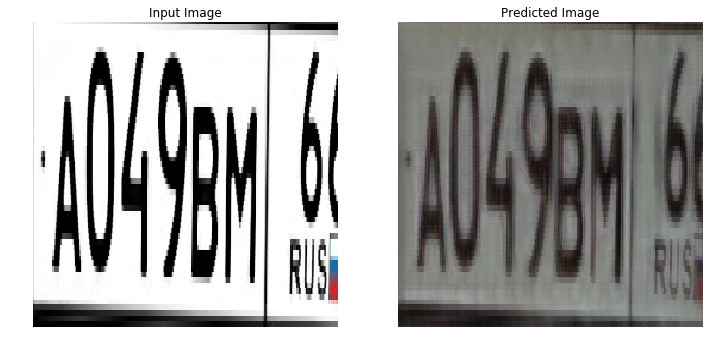

Time taken for epoch 27 is 1060.0124397277832 sec

................................................................................

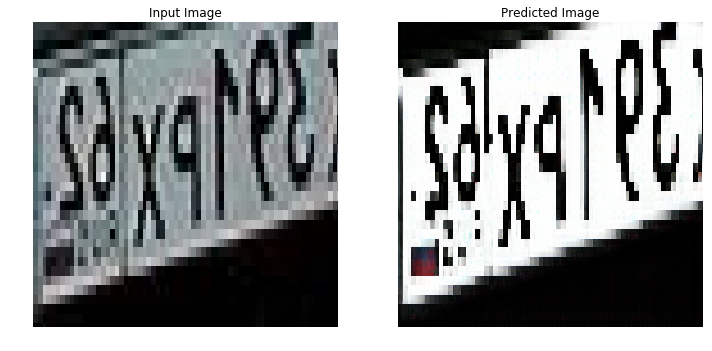

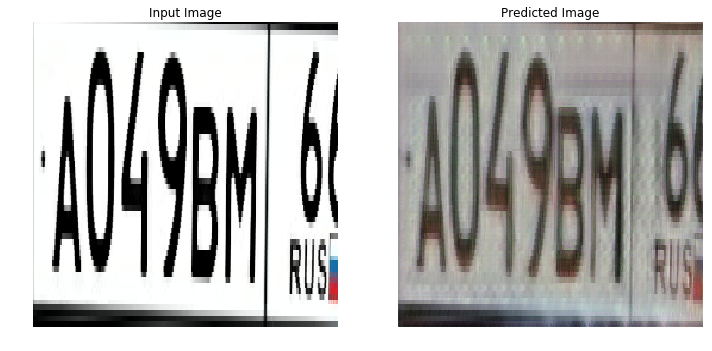

Time taken for epoch 28 is 1079.5708122253418 sec

.....

In [ ]:
for epoch in range(EPOCHS):
    start = time.time()

    n = 0
    for image_x, image_y in tf.data.Dataset.zip((train_real, train_rendered)):
        train_step(image_x, image_y)
        if n % 10 == 0:
            print ('.', end='')
        n += 1

    # clear_output(wait=True)
    
    # Using a consistent image (sample_real) so that the progress of the model
    # is clearly visible.
    generate_images(generator_g, sample_real)
    generate_images(generator_f, sample_rendered)

    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch + 1, ckpt_save_path))

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time() - start))